<div style="color:white;
            display:fill;
            border-radius:10px;
            background-color:#0e2f52;
            font-size:80%;
            font-family:Verdana;
            letter-spacing:1px">
    <h1 style='padding: 20px;
              color:white;
              text-align:center;'>
        HUMAN ACTIVITY RECOGNITION MODEL
    </h1>
    </div>

---
    
<div style="text-align: center;">
  <b>Akshay Shekade | Data Scientist | 2024 </b>
    
  <br>
  Follow me:
  <a href="https://akshayshekade.github.io/">Portfolio</a> | 
  <a href="https://www.linkedin.com/in/akshay-shekade-a225a8135/">Linkedin</a> | 
  <a href="https://github.com/AkshayShekade">GitHub</a> | 
  <a href="https://www.kaggle.com/akshayshekade">Kaggle</a> |
  <a href="https://public.tableau.com/app/profile/akshay.shekade/vizzes">Tableau</a>

    
</div>   


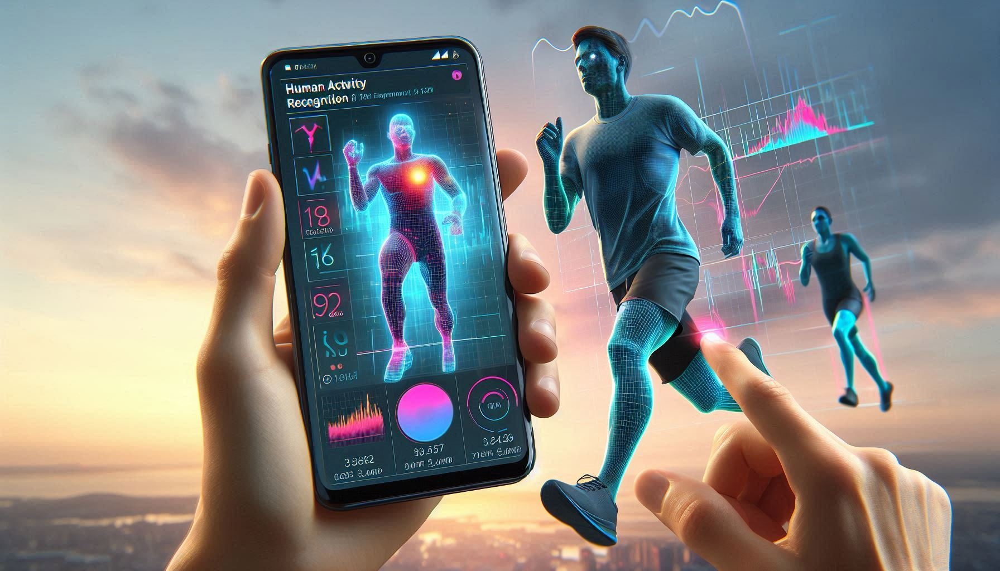

### Introduction

- This project could be useful for applications in health monitoring, fitness tracking, and security systems where activity recognition plays an essential role.
- The final model should be able to classify activities in real-time or near real-time, ensuring accurate and efficient monitoring of human activities using smartphone sensors.

### Objectives

1. **Understand the dataset and its features.**
2. **Clean and prepare the data for modeling.**
3. **Implement various classification algorithms to predict human activity.**
4. **Optimize model performance by tuning hyperparameters and focusing on important features.**
5. **Compare the performance of different classification algorithms.**



*The dataset and results are used for demonstrating the application of advanced machine learning techniques on real-world data. We aim to build effective classification models to predict human acitivity and gain a deeper understanding of machine learning techniques.*

### About the Dataset
The data is sourced from the king saud university and contains various features. This project uses a pre-processed and organized dataset to explore and understand machine learning algorithms, particularly for human activity prediction using classification techniques.

**Dataset:** Using accelerometer and gyroscope data collected at King Saud University    
- **Number of Rows:** 31,991
- **Number of Columns:** 8  

**Inputs:**
- **accX:** Acceleration along the X-axis in m/s², measured by the mobile phone’s accelerometer sensor.
- **accY:** Acceleration along the Y-axis in m/s², measured by the mobile phone’s accelerometer sensor.
- **accZ:** Acceleration along the Z-axis in m/s², measured by the mobile phone’s accelerometer sensor.
- **gyroX:** Angular velocity around the X-axis in rad/s, measured by the mobile phone’s gyroscope sensor.
- **gyroY:** Angular velocity around the Y-axis in rad/s, measured by the mobile phone’s gyroscope sensor.
- **gyroZ:** Angular velocity around the Z-axis in rad/s, measured by the mobile phone’s gyroscope sensor.
- **TimeStamp:** Timestamp of the recorded sensor data in HH.S format, indicating the time the measurement was taken.
- **Activity:** Label for the activity being performed. 1 represents standing (stop), and 0 represents walking.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

In [2]:
df = pd.read_csv("Data.csv")

In [3]:
df.head()

,accX,accY,accZ,gyroX,gyroY,gyroZ,timestamp,Activity
0,-0.496517,3.785628,8.954828,-0.142849,-0.126159,-0.022539,34:22.9,1
1,-0.462388,3.869603,9.281898,0.084349,0.096695,0.092130,34:23.0,1
2,-0.296084,3.820505,8.930728,0.061763,0.051543,0.071287,34:23.1,1
3,-0.469723,3.890110,8.744067,0.007641,0.028679,0.109433,34:23.2,1
4,-0.472418,4.109105,8.941207,-0.123640,0.099057,0.051943,34:23.3,1


In [4]:
df.tail()

,accX,accY,accZ,gyroX,gyroY,gyroZ,timestamp,Activity
31986,-0.488734,1.610800,10.610386,0.079187,-0.174218,-0.050365,03:15.1,1
31987,-0.049397,2.769092,7.008276,-0.083853,0.007656,-0.045658,03:15.2,1
31988,0.291294,3.002007,6.732400,0.005984,-0.058994,-0.087044,03:15.3,1
31989,0.256267,4.069138,8.687933,0.061487,-0.016278,-0.088728,03:15.4,1
31990,0.646356,5.273683,10.216704,-0.142294,-0.000884,0.048970,03:15.5,1


In [5]:
# To find the number of rows and columns
rows, columns = df.shape
print(f'Dataset has {rows} rows and {columns} columns')

Dataset has 31991 rows and 8 columns


In [6]:
# Looping to find the number of categorical and numerical features
num, cat = 0,0
for feature in df.columns:
    if df.dtypes[feature] != 'O':
        num += 1
    else:
        cat += 1
print('NUMBER OF NUMERICAL AND CATEGORICAL FEATURES:')
print(f'There are {num} numerical features and {cat} categorical features.')

NUMBER OF NUMERICAL AND CATEGORICAL FEATURES:
There are 7 numerical features and 1 categorical features.


In [7]:
# Categorcal and Numerical Features

cat_features = df.select_dtypes(include='object').columns
num_features = df.select_dtypes(include=['int64','float64']).columns

print('Categorical Features:', list(cat_features))
print('---------------------------')
print('Numerical Features:',list(num_features))

Categorical Features: ['timestamp']
---------------------------
Numerical Features: ['accX', 'accY', 'accZ', 'gyroX', 'gyroY', 'gyroZ', 'Activity']


In [8]:
count = df.nunique()
unique_val = pd.DataFrame({'unique Values': count})
unique_val

,unique Values
accX,15343
accY,18753
accZ,23353
gyroX,31097
gyroY,31048
gyroZ,31063
timestamp,21776
Activity,2


In [9]:
# Check out the missing values

missing_count = df.isnull().sum()
value_count = df.isnull().count()
missing_percentage = round(missing_count / value_count * 100, 2)
missing_df = pd.DataFrame({"count": missing_count, "percentage": missing_percentage})
missing_df

,count,percentage
accX,0,0.0
accY,0,0.0
accZ,0,0.0
gyroX,0,0.0
gyroY,0,0.0
gyroZ,0,0.0
timestamp,0,0.0
Activity,0,0.0


In [10]:
# Let's observe first the unique values

def get_unique_values(df):
    output_data = []
    for col in df.columns:
        # If the number of unique values in the column is less than or equal to 5
        if df.loc[:, col].nunique() <= 10:
            # Get the unique values in the column
            unique_values = df.loc[:, col].unique()
            # Append the column name, number of unique values, unique values, and data type to the output data
            output_data.append([col, df.loc[:, col].nunique(), unique_values, df.loc[:, col].dtype])
        else:
            # Otherwise, append only the column name, number of unique values, and data type to the output data
            output_data.append([col, df.loc[:, col].nunique(),"-", df.loc[:, col].dtype])

    output_df = pd.DataFrame(output_data, columns=['Column Name', 'Number of Unique Values', ' Unique Values ', 'Data Type'])

    return output_df

In [11]:
get_unique_values(df)

,Column Name,Number of Unique Values,Unique Values,Data Type
0,accX,15343,-,float64
1,accY,18753,-,float64
2,accZ,23353,-,float64
3,gyroX,31097,-,float64
4,gyroY,31048,-,float64
5,gyroZ,31063,-,float64
6,timestamp,21776,-,object
7,Activity,2,"[1, 0]",int64


In [12]:
# Check duplicates and drops them

def duplicate_values(df):
    print("Duplicate check...")
    num_duplicates = df.duplicated(subset=None, keep='first').sum()
    if num_duplicates > 0:
        print("There are", num_duplicates, "duplicated observations in the dataset.")
        df.drop_duplicates(keep='first', inplace=True)
        print(num_duplicates, "duplicates were dropped!")
        print("No more duplicate rows!")
    else:
        print("There are no duplicated observations in the dataset.")

duplicate_values(df)

Duplicate check...
There are 144 duplicated observations in the dataset.
144 duplicates were dropped!
No more duplicate rows!


In [13]:
df.duplicated().sum()

0

- Understanding the context and data collection methods is crucial to determine the cause of duplicates. 
- Whether to drop duplicates depends on the analysis purpose.
- For analyzing changes over time or variations, keeping duplicates might be more appropriate.
- However, since I will be using a classification model, I dropped these rows because duplicate rows contain similar values. 

In [14]:
# Basic statistics summary of Numerical features

df.describe().T.style.background_gradient(cmap='PuBu')

,count,mean,std,min,25%,50%,75%,max
accX,31847.000000,0.026158,0.741464,-3.673361,-0.469499,-0.021705,0.479453,4.678671
accY,31847.000000,2.152577,1.086719,-4.386029,1.409469,2.117497,2.927014,6.377039
accZ,31847.000000,9.538051,2.056548,4.296066,7.794067,9.407487,11.158695,17.591568
gyroX,31847.000000,-0.004459,0.307732,-1.470421,-0.149783,0.022291,0.177924,1.332722
gyroY,31847.000000,-0.014737,0.249245,-1.430659,-0.162515,-0.011062,0.124854,1.480135
gyroZ,31847.000000,-0.007106,0.266290,-1.894102,-0.154353,0.005099,0.152061,1.482268
Activity,31847.000000,0.982071,0.132697,0.000000,1.000000,1.000000,1.000000,1.000000


# EXPLORATORY DATA ANALYSIS

In [15]:
# Target Feature

df['Activity'].value_counts(normalize = True) # Imbalanced Data

Activity
1    0.982071
0    0.017929
Name: proportion, dtype: float64

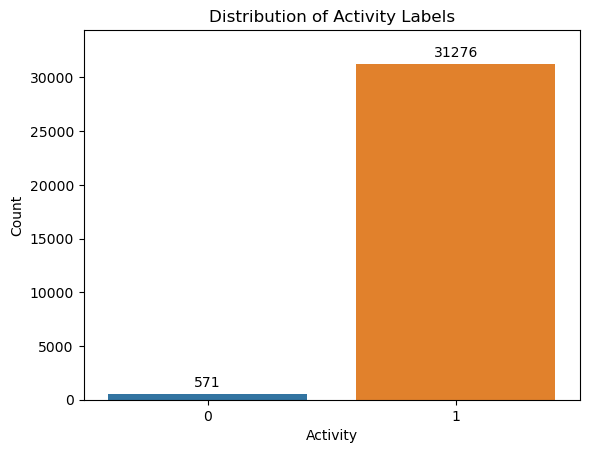

In [16]:
sns.countplot(x ='Activity', data = df, palette='tab10')
plt.title('Distribution of Activity Labels')
plt.xlabel('Activity')
plt.ylabel('Count')
plt.ylim(0, df['Activity'].value_counts().max() * 1.1)

for p in plt.gca().patches:
    plt.gca().annotate(f'{int(p.get_height())}', 
                       (p.get_x() + p.get_width() / 2., p.get_height()), 
                       ha='center', va='baseline', 
                       color='black', xytext=(0, 5),
                       textcoords='offset points')
    
plt.show()

#### The class distribution shows a strong imbalance:

- **`Class 1`** (likely the majority class) comprises approximately **`98.2%`** of the data.
- **`Class 0`**  makes up only about **`1.8%`**.

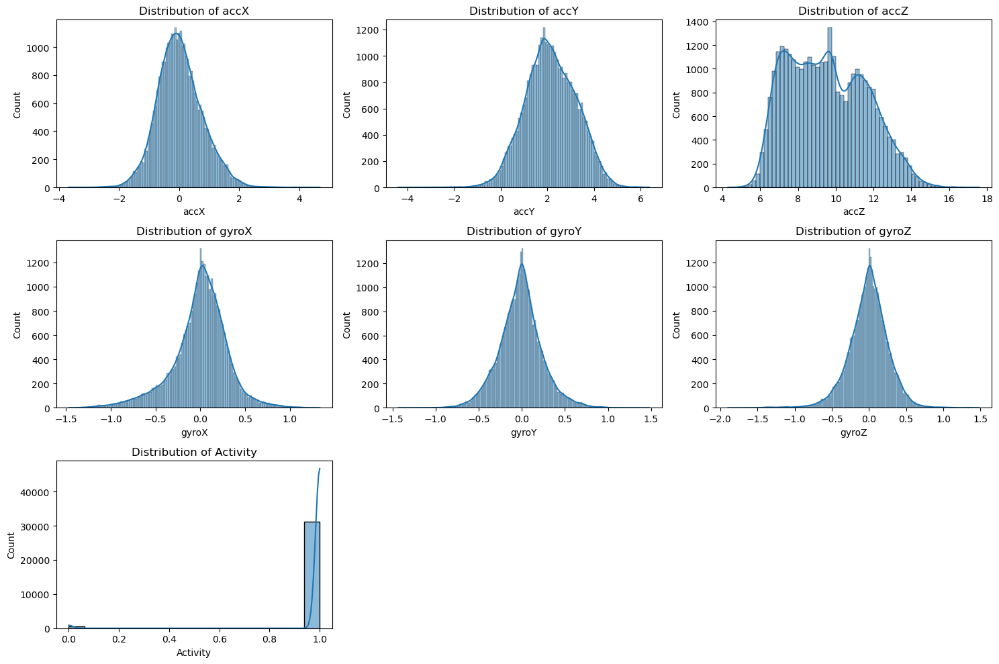

In [17]:
numerical_df = df.select_dtypes(include=['number'])

plt.figure(figsize=(15, 10))

num_vars = len(numerical_df.columns)

for i, var in enumerate(numerical_df.columns, 1):
    plt.subplot((num_vars // 3) + 1, 3, i)
    sns.histplot(data = df, x = var, kde = True)
    plt.title(f'Distribution of {var}')
    
plt.tight_layout()
plt.show()

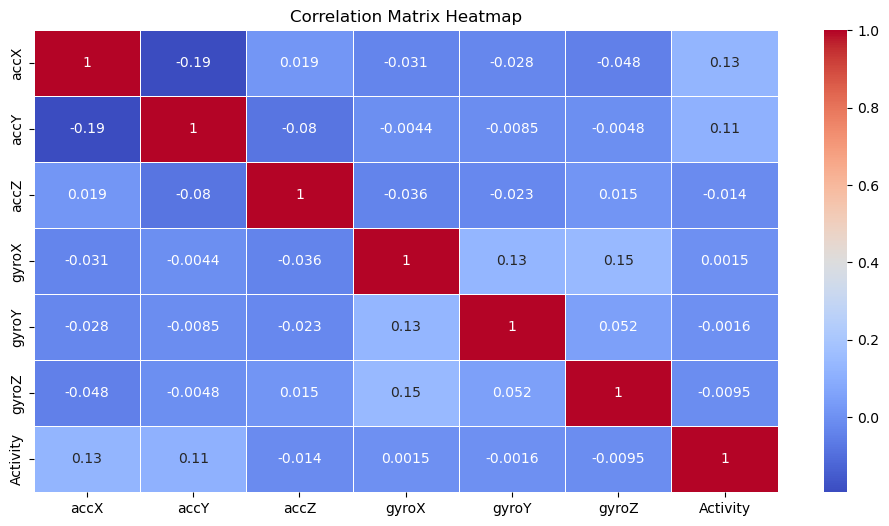

In [18]:
correlation_matrix = numerical_df.corr()

plt.figure(figsize=(12,6))
sns.heatmap(correlation_matrix, annot = True, cmap ='coolwarm', linewidths = 0.5)
plt.title('Correlation Matrix Heatmap')
plt.show()

In [19]:
# Check Multicolinarty between features

def color_custom(val):
    if val > 0.90 and val < 0.99:
        color = 'red'
    elif val >= 1:
        color = 'blue'
    else:
        color = 'black'
    return f'color: {color}'

numerical_df.corr().style.map(color_custom)

,accX,accY,accZ,gyroX,gyroY,gyroZ,Activity
accX,1.000000,-0.193934,0.018630,-0.031481,-0.028269,-0.048047,0.127476
accY,-0.193934,1.000000,-0.080130,-0.004420,-0.008497,-0.004790,0.113456
accZ,0.018630,-0.080130,1.000000,-0.035754,-0.022741,0.014505,-0.014470
gyroX,-0.031481,-0.004420,-0.035754,1.000000,0.129366,0.145501,0.001487
gyroY,-0.028269,-0.008497,-0.022741,0.129366,1.000000,0.051933,-0.001600
gyroZ,-0.048047,-0.004790,0.014505,0.145501,0.051933,1.000000,-0.009518
Activity,0.127476,0.113456,-0.014470,0.001487,-0.001600,-0.009518,1.000000


In [20]:
# Corr between Target vs other Features

correlation_matrix = numerical_df.corr() # Labeled df

act_corr = correlation_matrix['Activity'].sort_values(ascending= False)
act_corr

Activity    1.000000
accX        0.127476
accY        0.113456
gyroX       0.001487
gyroY      -0.001600
gyroZ      -0.009518
accZ       -0.014470
Name: Activity, dtype: float64

In [21]:
# Checking Outliers

import plotly.graph_objects as go
from plotly.subplots import make_subplots

num_cols = numerical_df.iloc[:, :6]
rows = 3
cols = 3

# Create a subplot figure with specified layout
fig = make_subplots(rows = 2, cols = 3, subplot_titles = num_cols.columns, vertical_spacing = 0.100)

# Loop through each numerical column and create a box plot
for i, col in enumerate(num_cols.columns):
    # Determine the current row and column in the grid
    row = (i // cols) + 1
    col_position = (i % cols) + 1
    
    
    # Add box plot for each column to the subplot
    fig.add_trace(
        go.Box(y = num_cols[col], name = col),
        row = row,
        col = col_position
    )

# Update layout for title and spacing
fig.update_layout(
    height = 1000, 
    width = 1000, 
    title_text = "Boxplots of Numerical Columns",
    showlegend = False
)

# Show plot
fig.show()


#### When to Remove Outliers

1. **Skewed Data**: If outliers skew the data distribution significantly, removing them can help in normalizing the distribution, leading to better model performance.
2. **Influence on Model Coefficients**: If outliers have a large influence on the estimated coefficients, it may distort the model. Removing such outliers can help in achieving more robust coefficients.
3. **Error Reduction**: In cases where outliers are due to data entry errors or anomalies not representative of the underlying distribution, removing them can reduce noise and improve model accuracy.
4. **Improving Model Fit**: When diagnostics and residual analysis indicate that outliers adversely affect model fit and prediction accuracy, it’s beneficial to remove them.

#### When Not to Remove Outliers

1. **Genuine Data Points**: If outliers are genuine observations that reflect real variability in the data, they should not be removed, as they provide important information about the data distribution.
2. **Informative Outliers**: Sometimes outliers may carry valuable information about specific conditions or factors that should be modeled. Retaining them ensures the model captures these effects.
3. **Small Sample Size**: In datasets with a small number of observations, removing outliers can lead to loss of valuable data and reduce the model's generalizability.

# Data Pre-processing

In [22]:
# Importing necessary libraries

from imblearn.combine import SMOTEENN
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.preprocessing import StandardScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay, classification_report, roc_auc_score, roc_curve, auc

In [23]:
# Separate features and target

X = df.drop(['timestamp','Activity'],axis=1)
y = df['Activity']

In [24]:
# Split the data into training and testing sets

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

In [25]:
# Apply SMOTEENN to balance the dataset

smote_enn = SMOTEENN(random_state=42)
X_train_resampled, y_train_resampled = smote_enn.fit_resample(X_train, y_train)

In [26]:
# Check the new class distribution

print(f"Original class distribution: {y_train.value_counts()}")
print('---' * 15)
print(f"Resampled class distribution: {y_train_resampled.value_counts()}")

Original class distribution: Activity
1    25020
0      457
Name: count, dtype: int64
---------------------------------------------
Resampled class distribution: Activity
0    24865
1    22985
Name: count, dtype: int64


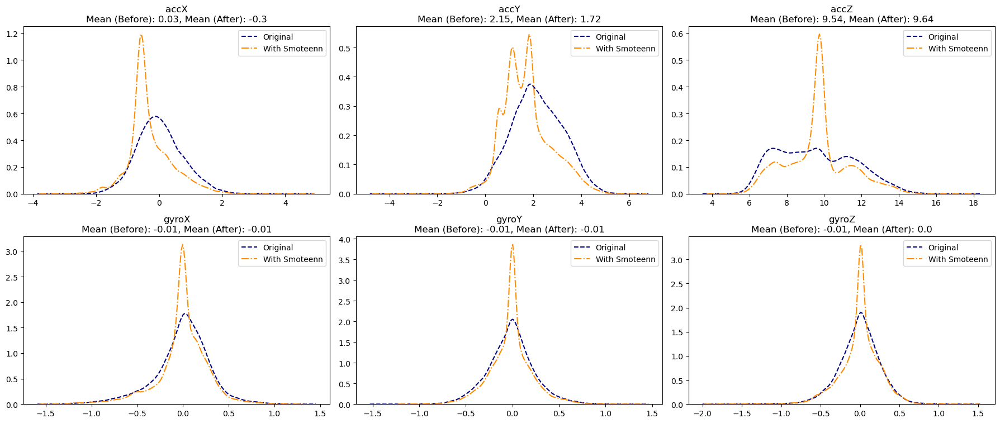

In [27]:
fig,axes = plt.subplots(2,3,figsize=(18,8))
features = X_train.columns.to_list()
axes = axes.flatten()

for col,ax in zip(features,axes):
  sns.kdeplot(data = X_train, x = col, ax = ax, ls ='--', color ='navy', label ='Original')
  sns.kdeplot(data = X_train_resampled, x = col, ax = ax, ls = '-.', color ='darkorange', label ='With Smoteenn')
  ax.set_title(f'{col}\nMean (Before): {round(X_train[col].mean(), 2)}, Mean (After): {round(X_train_resampled[col].mean(), 2)}')
  ax.set_xlabel('')
  ax.set_ylabel('')
  ax.legend()

plt.tight_layout(rect=[0,0,1,0.96])
plt.show()

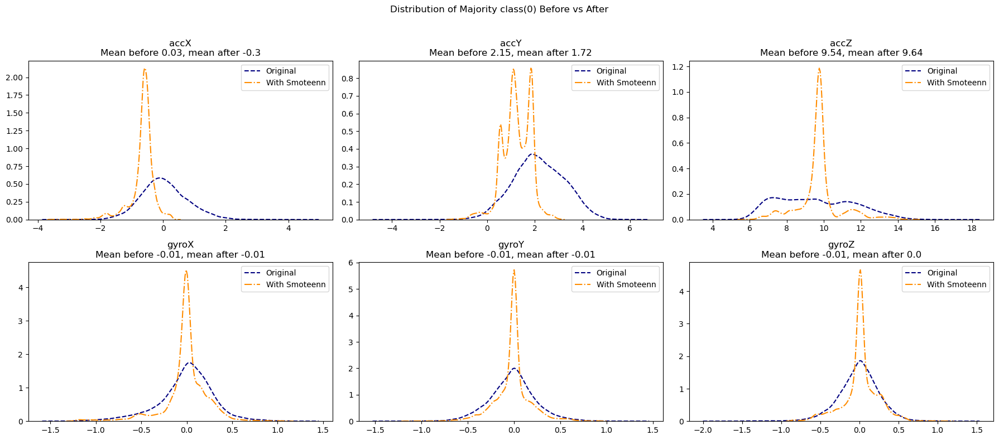

In [28]:
fig,axes = plt.subplots(2,3,figsize=(18,8))
features = X_train.columns.to_list()
axes = axes.flatten()

fig.suptitle('Distribution of Majority class(0) Before vs After')

original = pd.concat((X_train,y_train), axis = 1).query('Activity == 1')
after_inpute = pd.concat((X_train_resampled, y_train_resampled),axis = 1).query('Activity == 0')

for col,ax in zip(features,axes):
  sns.kdeplot(data = original, x = col, ax = ax, ls ='--', color ='navy', label ='Original')
  sns.kdeplot(data = after_inpute, x = col, ax = ax, ls ='-.', color ='darkorange', label ='With Smoteenn')
  ax.set_title(f'{col}\nMean before {round(X_train[col].mean(),2)}, mean after {round(X_train_resampled[col].mean(),2)}')
  ax.set_xlabel('')
  ax.set_ylabel('')
  ax.legend()

plt.tight_layout(rect=[0,0,1,0.96])
plt.show()


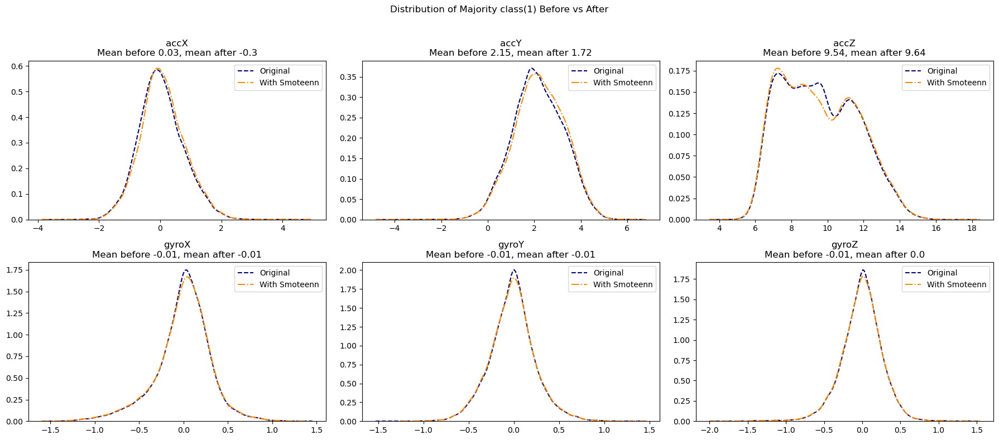

In [29]:
fig,axes = plt.subplots(2,3,figsize=(18,8))
features = X_train.columns.to_list()
axes = axes.flatten()

fig.suptitle('Distribution of Majority class(1) Before vs After')

original = pd.concat((X_train,y_train), axis = 1).query('Activity == 1')
after_inpute = pd.concat((X_train_resampled, y_train_resampled),axis = 1).query('Activity == 1')

for col,ax in zip(features,axes):
  sns.kdeplot(data = original, x = col, ax = ax, ls ='--', color ='navy', label ='Original')
  sns.kdeplot(data = after_inpute, x = col, ax = ax, ls ='-.', color ='darkorange', label ='With Smoteenn')
  ax.set_title(f'{col}\nMean before {round(X_train[col].mean(),2)}, mean after {round(X_train_resampled[col].mean(),2)}')
  ax.set_xlabel('')
  ax.set_ylabel('')
  ax.legend()

plt.tight_layout(rect=[0,0,1,0.96])
plt.show()


In [30]:
pd.concat((X_train,y_train), axis = 1).query('Activity == 0').describe().T

,count,mean,std,min,25%,50%,75%,max
accX,457.0,-0.656806,0.434198,-3.544330,-0.748144,-0.600252,-0.460742,0.404160
accY,457.0,1.246112,0.631235,-1.477577,0.863105,1.234034,1.757795,3.096311
accZ,457.0,9.742602,1.173587,5.768554,9.450298,9.733808,9.917776,14.785204
gyroX,457.0,-0.006868,0.284596,-1.229589,-0.075405,-0.000545,0.125675,1.080128
gyroY,457.0,-0.007205,0.234007,-1.141854,-0.090515,-0.001650,0.060038,0.931542
gyroZ,457.0,0.014091,0.255703,-0.851049,-0.065517,0.012459,0.139830,1.124462
Activity,457.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [31]:
pd.concat((X_train_resampled, y_train_resampled),axis=1).query('Activity == 0').describe().T

,count,mean,std,min,25%,50%,75%,max
accX,24865.0,-0.660245,0.394114,-3.544330,-0.733249,-0.595224,-0.475600,0.404160
accY,24865.0,1.234910,0.596996,-1.477577,0.870995,1.213866,1.757357,3.096311
accZ,24865.0,9.742946,1.135079,5.768554,9.488766,9.743832,9.891147,14.785204
gyroX,24865.0,-0.006934,0.246238,-1.229589,-0.058491,-0.001150,0.092664,1.080128
gyroY,24865.0,-0.011487,0.193545,-1.141854,-0.079212,-0.002586,0.041003,0.931542
gyroZ,24865.0,0.017081,0.223455,-0.851049,-0.042727,0.014426,0.112265,1.124462
Activity,24865.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


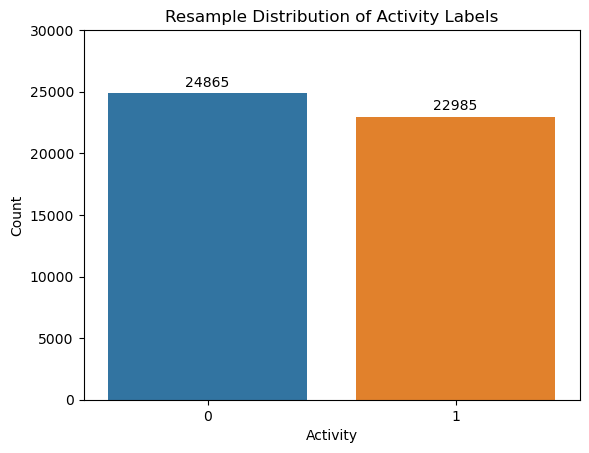

In [32]:
sns.countplot(x ='Activity', data = pd.concat((X_train_resampled, y_train_resampled),axis=1), palette='tab10')
plt.title('Resample Distribution of Activity Labels')
plt.xlabel('Activity')
plt.ylabel('Count')
plt.ylim(0, 30000)

for p in plt.gca().patches:
    plt.gca().annotate(f'{int(p.get_height())}', 
                       (p.get_x() + p.get_width() / 2., p.get_height()), 
                       ha='center', va='baseline', 
                       color='black', xytext=(0, 5),
                       textcoords='offset points')
    
plt.show()

In [33]:
scaler = StandardScaler()
scaler.fit(X_train_resampled, y_train_resampled)
X_res_tm = scaler.transform(X_train_resampled)

In [34]:
from statsmodels.api import Logit

model = Logit(y_train_resampled,X_res_tm).fit(maxiter=50)

Optimization terminated successfully.
         Current function value: 0.352369
         Iterations 7


In [35]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:               Activity   No. Observations:                47850
Model:                          Logit   Df Residuals:                    47844
Method:                           MLE   Df Model:                            5
Date:                Fri, 15 Nov 2024   Pseudo R-squ.:                  0.4911
Time:                        19:44:31   Log-Likelihood:                -16861.
converged:                       True   LL-Null:                       -33130.
Covariance Type:            nonrobust   LLR p-value:                     0.000
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1             2.2395      0.023     97.163      0.000       2.194       2.285
x2             1.8778      0.021     90.638      0.000       1.837       1.918
x3             0.2951      0.015     19.227      0.000       0.265       0.325
x4             0.0561      0.014      4.125      0.000       0.029       0.083
x5             0.0135      0.014      0.978      0.328      -0.014       0.040
x6            -0.0982      0.014     -7.091      0.000      -0.125      -0.071
==============================================================================
"""

In [36]:
vif = pd.DataFrame({
    'Features': X_train.columns,
    'VIF': [round(variance_inflation_factor(X_res_tm, i), 2) for i in range(X_res_tm.shape[1])]
})
vif = vif.sort_values(by="VIF", ascending=False).reset_index(drop=True)
vif

,Features,VIF
0,accY,1.06
1,gyroX,1.05
2,accZ,1.04
3,accX,1.03
4,gyroY,1.03
5,gyroZ,1.02


In [37]:
model.conf_int().set_index(X_train.columns)

,0,1
accX,2.194303,2.284651
accY,1.837189,1.918399
accZ,0.264974,0.325129
gyroX,0.029469,0.082824
gyroY,-0.013532,0.040475
gyroZ,-0.125314,-0.071043


# Logistics Regression

In [38]:
# Initialize Logistic Regression model

lr = LogisticRegression(random_state=42)

In [39]:
# Fit the model

lr.fit(X_res_tm, y_train_resampled)

LogisticRegression(random_state=42)

In [40]:
y_pred_lr = lr.predict(X_res_tm)
accuracy_lr = accuracy_score(y_train_resampled, y_pred_lr)
print(f"Logistic Regression Accuracy: {accuracy_lr:.2f}")

Logistic Regression Accuracy: 0.88


In [41]:
print(f"Classification Report:\n {classification_report(y_train_resampled, y_pred_lr)}")

Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.94      0.89     24865
           1       0.92      0.82      0.87     22985

    accuracy                           0.88     47850
   macro avg       0.89      0.88      0.88     47850
weighted avg       0.89      0.88      0.88     47850



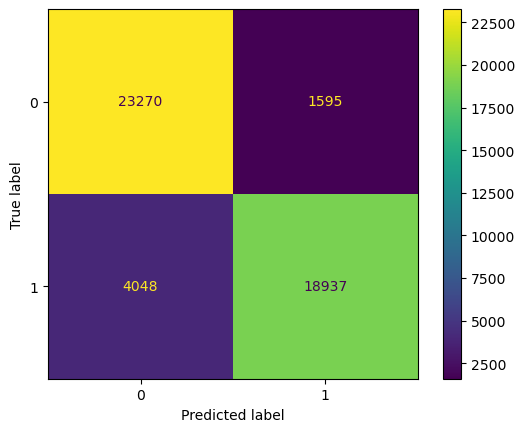

In [42]:
result_lr = confusion_matrix(y_train_resampled, y_pred_lr)
cm = ConfusionMatrixDisplay(result_lr)
cm.plot()
plt.show()

In [43]:
# Compute ROC curve and ROC area

fpr, tpr, _ = roc_curve(y_train_resampled, y_pred_lr)
roc_auc_lr = auc(fpr, tpr)

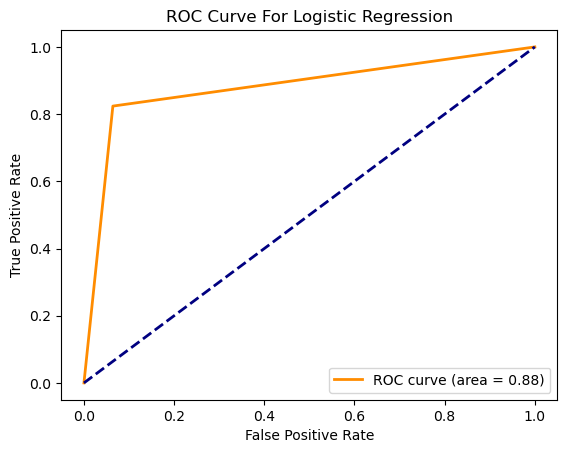

In [44]:
# Plotting the ROC curve

plt.plot(fpr, tpr, color ='darkorange', lw = 2, label ='ROC curve (area = %0.2f)' % roc_auc_lr)
plt.plot([0, 1], [0, 1], color ='navy', lw = 2, linestyle ='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve For Logistic Regression')
plt.legend(loc ="lower right")
plt.show()

# Gradient Boosting Classifier

In [45]:
# Initialize Gradient Boosting Classifier

gb = GradientBoostingClassifier(random_state=42)

In [46]:
# Fit the model

gb.fit(X_res_tm, y_train_resampled)

GradientBoostingClassifier(random_state=42)

In [47]:
y_pred_gb = gb.predict(X_res_tm)
accuracy_gb = accuracy_score(y_train_resampled, y_pred_gb)
print(f"Gradient Boosting Classifier Accuracy: {accuracy_gb:.2f}")

Gradient Boosting Classifier Accuracy: 0.95


In [48]:
print(f"Classification Report:\n {classification_report(y_train_resampled, y_pred_gb)}")

Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.96      0.95     24865
           1       0.95      0.94      0.95     22985

    accuracy                           0.95     47850
   macro avg       0.95      0.95      0.95     47850
weighted avg       0.95      0.95      0.95     47850



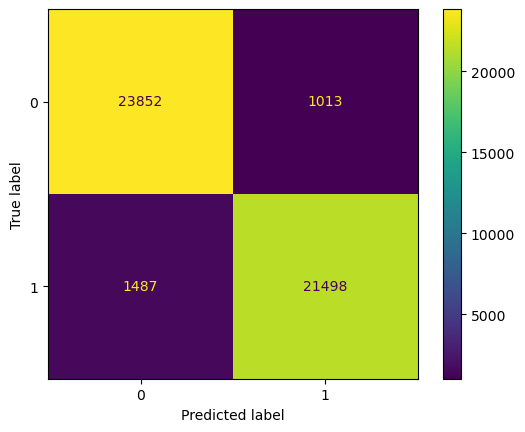

In [49]:
result_gb = confusion_matrix(y_train_resampled, y_pred_gb)
cm = ConfusionMatrixDisplay(result_gb)
cm.plot()
plt.show()

In [50]:
# Compute ROC curve and ROC area

fpr, tpr, _ = roc_curve(y_train_resampled, y_pred_gb)
roc_auc_gb = auc(fpr, tpr)

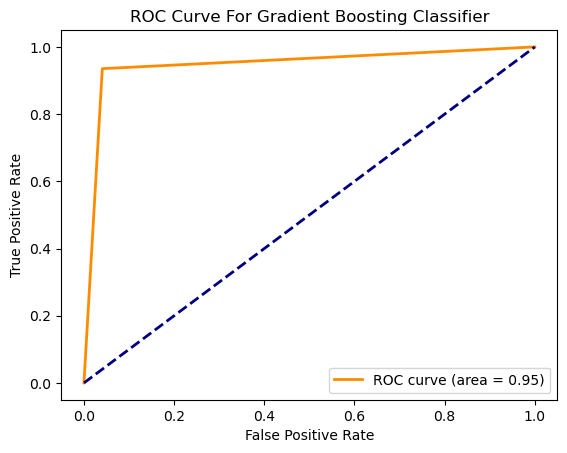

In [51]:
# Plotting the ROC curve

plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc_gb)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve For Gradient Boosting Classifier')
plt.legend(loc="lower right")
plt.show()

# Support Vector Classifier (SVC)

In [52]:
# Initialize Support Vector Classifier

svc = SVC(random_state=42)

In [53]:
# Fit the model

svc.fit(X_res_tm, y_train_resampled)

SVC(random_state=42)

In [54]:
y_pred_svc = svc.predict(X_res_tm)
accuracy_svc = accuracy_score(y_train_resampled, y_pred_svc)
print(f"Support Vector Classifier Accuracy: {accuracy_svc:.2f}")

Support Vector Classifier Accuracy: 0.96


In [55]:
print(f"Classification Report:\n {classification_report(y_train_resampled, y_pred_svc)}")

Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.98      0.96     24865
           1       0.97      0.93      0.95     22985

    accuracy                           0.96     47850
   macro avg       0.96      0.95      0.96     47850
weighted avg       0.96      0.96      0.96     47850



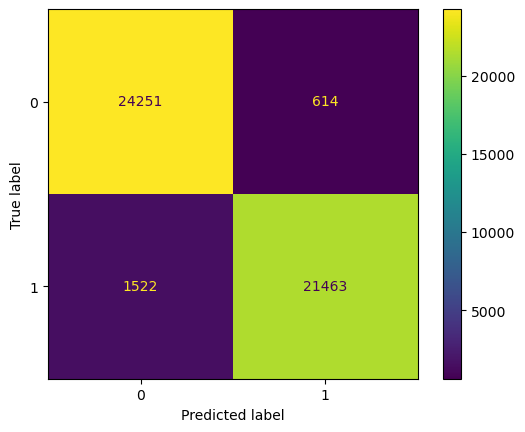

In [56]:
result_svc = confusion_matrix(y_train_resampled, y_pred_svc)
cm = ConfusionMatrixDisplay(result_svc)
cm.plot()
plt.show()

In [57]:
# Compute ROC curve and ROC area

fpr, tpr, _ = roc_curve(y_train_resampled, y_pred_svc)
roc_auc_svc = auc(fpr, tpr)

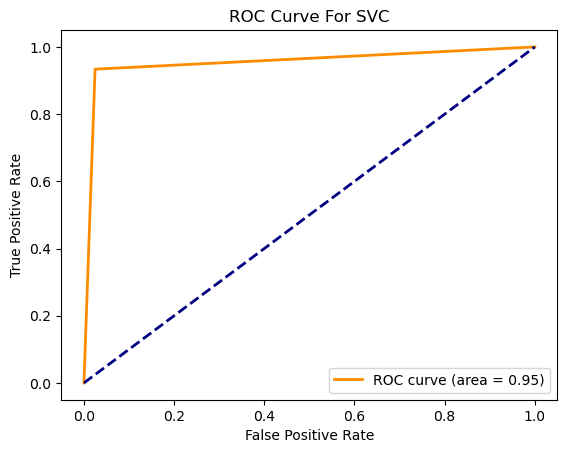

In [58]:
# Plotting the ROC curve

plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc_svc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve For SVC')
plt.legend(loc="lower right")
plt.show()

# XGBoost Classifier

In [59]:
# Initialize XGBoost Classifier

xgb = XGBClassifier(random_state=42)

In [60]:
# Fit the model

xgb.fit(X_res_tm, y_train_resampled)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=42, ...)

In [61]:
y_pred_xgb = xgb.predict(X_res_tm)
accuracy_xgb = accuracy_score(y_train_resampled, y_pred_xgb)
print(f"XGBoost Classifier Accuracy: {accuracy_xgb:.2f}")

XGBoost Classifier Accuracy: 1.00


In [62]:
print(f"Classification Report:\n {classification_report(y_train_resampled, y_pred_xgb)}")

Classification Report:
               precision    recall  f1-score   support

           0       0.99      1.00      1.00     24865
           1       1.00      0.99      1.00     22985

    accuracy                           1.00     47850
   macro avg       1.00      1.00      1.00     47850
weighted avg       1.00      1.00      1.00     47850



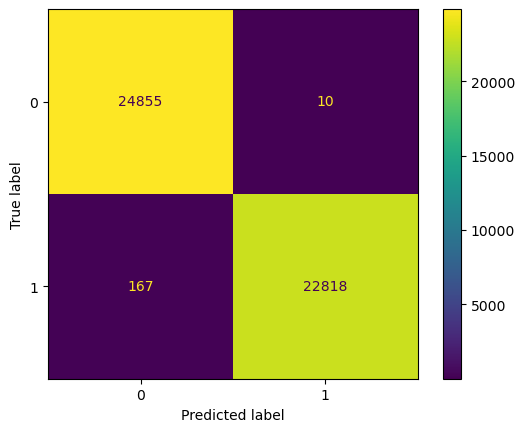

In [63]:
result_xgb = confusion_matrix(y_train_resampled, y_pred_xgb)
cm = ConfusionMatrixDisplay(result_xgb)
cm.plot()
plt.show()

In [64]:
# Compute ROC curve and ROC area

fpr, tpr, _ = roc_curve(y_train_resampled, y_pred_xgb)
roc_auc_xgb = auc(fpr, tpr)

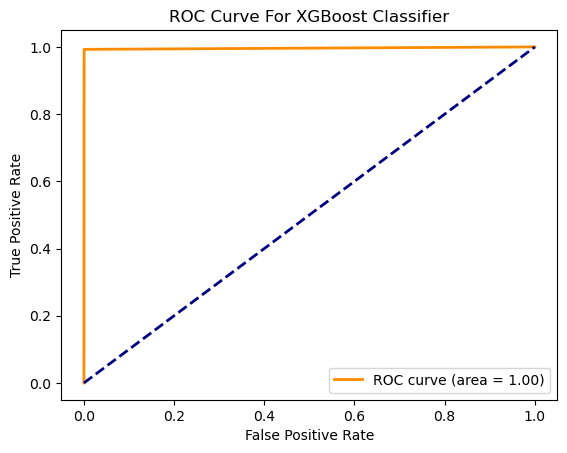

In [65]:
# Plotting the ROC curve

plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc_xgb)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve For XGBoost Classifier')
plt.legend(loc="lower right")
plt.show()

# Comparison of Models

In [66]:
result = pd.DataFrame({
    'Algorithm' : ['Logistic Regression', 'Gradient Boosting Classifier', 'Support Vector Classifier', 'XGBoost Classifier'],
    'Score' : [accuracy_lr, accuracy_gb, accuracy_svc, accuracy_xgb],
    'ROC AUC Score' : [roc_auc_lr, roc_auc_gb, roc_auc_svc, roc_auc_xgb]
})

result.sort_values(by='Score', inplace=True, ignore_index=True)

In [67]:
result.style.background_gradient(cmap='PuBu')

,Algorithm,Score,ROC AUC Score
0,Logistic Regression,0.882069,0.879869
1,Gradient Boosting Classifier,0.947753,0.947283
2,Support Vector Classifier,0.955361,0.954545
3,XGBoost Classifier,0.996301,0.996166


<div style="border-radius:20px; padding: 15px; font-size:100%; text-align:left; ">

<span style="font-size:120%; font-weight:700; color:#005f26">Acording to the above results, best algorithm based on Score is :</span>

<span style="font-size:100%; font-weight:500; color:#005f26">
<ul> XGBoost Classifier </ul>
</br>
</span>

<span style="font-size:150%; font-weight:bolder; color:navy">So, We choose <mark> XGBoost Classifier </mark></span>
</div>

In [68]:
import joblib

# Save the best model
joblib.dump(accuracy_xgb, 'human_activity_recognition_model.pkl')

['human_activity_recognition_model.pkl']

<a id='import'></a>
<div style="color:white;
            display:fill;
            border-radius:10px;
            background-color:#0e2f52;
            font-size:100%;
            font-family:Verdana;
            letter-spacing:1px">
    <h3 style='padding: 20px;
              color:white;
              text-align:center;'>
        Thank you...
    </h3>
    </div>

---

<div style="text-align: center;">
  <b>Akshay Shekade | Data Scientist | 2024 </b>
    
  <br>
  Follow me:
  <a href="https://akshayshekade.github.io/">Portfolio</a> | 
  <a href="https://www.linkedin.com/in/akshay-shekade-a225a8135/">Linkedin</a> | 
  <a href="https://github.com/AkshayShekade">GitHub</a> | 
  <a href="https://www.kaggle.com/akshayshekade">Kaggle</a> |
  <a href="https://public.tableau.com/app/profile/akshay.shekade/vizzes">Tableau</a>

    
</div>   